In [1]:
# Datagen inspo taken from 
# https://colab.research.google.com/github/reiinakano/invariant-risk-minimization/blob/master/invariant_risk_minimization_colored_mnist.ipynb#scrollTo=sopHPgEhu4Jo

%matplotlib notebook
import os

import numpy as np
from PIL import Image

import matplotlib.pyplot as plt

import torch
from torch import nn
from torchvision import datasets
import torchvision.datasets.utils as dataset_utils

import random

from sklearn.model_selection import StratifiedShuffleSplit

import pickle 
import seaborn as sns

SEED = 1234
DEVICE = 'cpu'
np.random.seed(SEED)
torch.manual_seed(SEED)

In [37]:
data_path = './data/'
if not os.path.exists(data_path):
    os.makedirs(data_path)
train_mnist = datasets.mnist.MNIST(data_path, train=True, download=True)
test_mnist = datasets.mnist.MNIST(data_path, train=False, download=True)

<IPython.core.display.Javascript object>


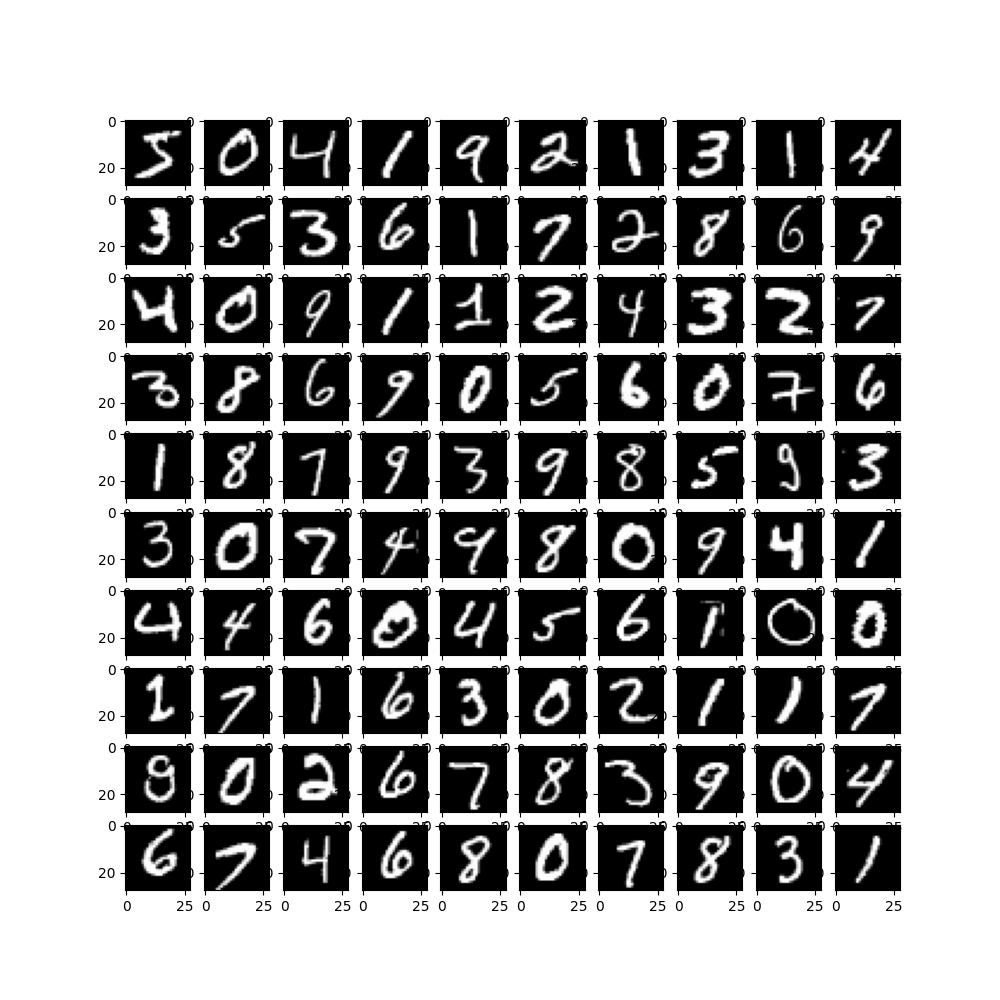

In [4]:
fig,axs = plt.subplots(10,10, figsize=(10,10))
plot_ind = 0
for i in range(10):
    for j in range(10):
        axs[i,j].imshow(train_mnist[plot_ind][0], cmap='gray')
        plot_ind+=1
        
plt.show()

In [5]:
np.array(train_mnist[0][0]).shape

(28, 28)

<IPython.core.display.Javascript object>


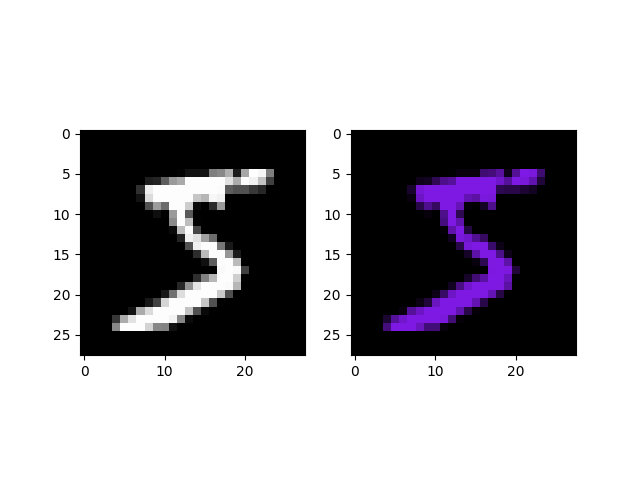

In [6]:
arr = np.array(train_mnist[0][0]).reshape((28,28,1))
arr_3 = np.concatenate([np.array(arr*0.5,dtype=int),np.array(arr*0.1,dtype=int),np.array(arr*0.9,dtype=int)], axis=2)

fig,axs = plt.subplots(1,2)
axs[0].imshow(arr, cmap='gray')
axs[1].imshow(arr_3)
plt.show()


In [7]:
def plot_dataset_digits(dataset):
    fig = plt.figure(figsize=(13, 8))
    columns = 6
    rows = 3
    # ax enables access to manipulate each of subplots
    ax = []

    for i in range(columns * rows):
        img, label = dataset[i]
        # create subplot and append to ax
        ax.append(fig.add_subplot(rows, columns, i + 1))

        green = np.round(label/10 + 0.1, decimals=1) 
        blue = np.round(1 - green, decimals=1)
        
        ax[-1].set_title(f'(r,g,b)=(0.5,{green},{blue})')  # set title
        arr = np.array(img).reshape((28,28,1))
        
        im_arr = np.concatenate([np.array(arr*0.5,dtype=int),np.array(arr*green,dtype=int),np.array(arr*blue,dtype=int)], axis=2)
        
        plt.imshow(im_arr)

    plt.show()  # finally, render the plot


<IPython.core.display.Javascript object>


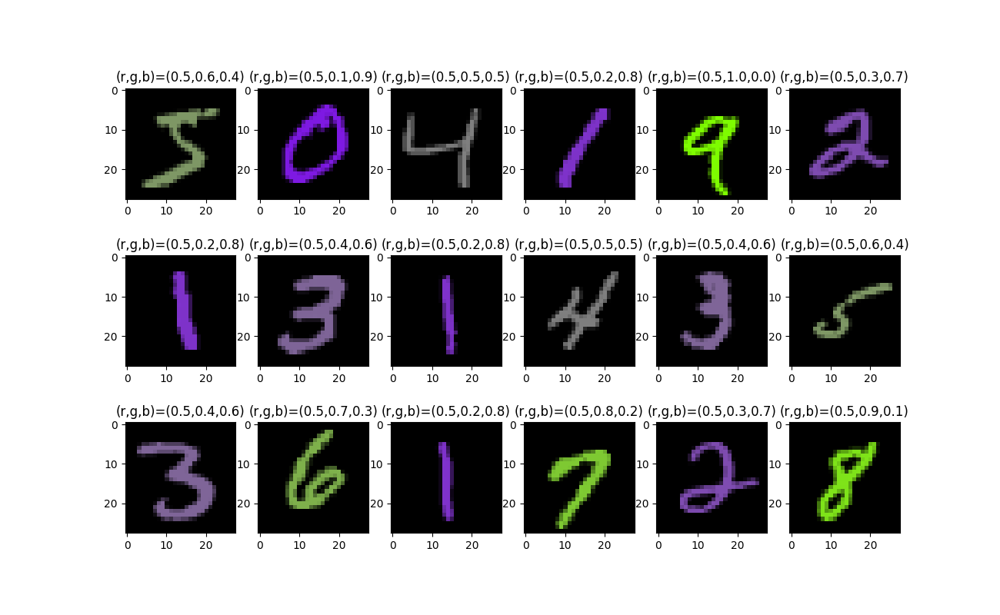

In [8]:
plot_dataset_digits(train_mnist)

In [38]:
def plot_dataset_digits(dataset):
    fig = plt.figure(figsize=(13, 8))
    columns = 6
    rows = 3
    # ax enables access to manipulate each of subplots
    ax = []

    for i in range(columns * rows):
        img, label = dataset[i]
        # create subplot and append to ax
        ax.append(fig.add_subplot(rows, columns, i + 1))

        green = np.round(label/10 + 0.1, decimals=1) 
        blue = np.round(1 - green, decimals=1)
        
        ax[-1].set_title(f'(r,g,b)=(0.5,{green},{green})')  # set title
        arr = np.array(img).reshape((28,28,1))
        
        im_arr = np.concatenate([np.array(arr,dtype=int),np.array(arr,dtype=int),np.array(arr,dtype=int)], axis=2)
        
        plt.imshow(im_arr)

    plt.show()  # finally, render the plot


<IPython.core.display.Javascript object>


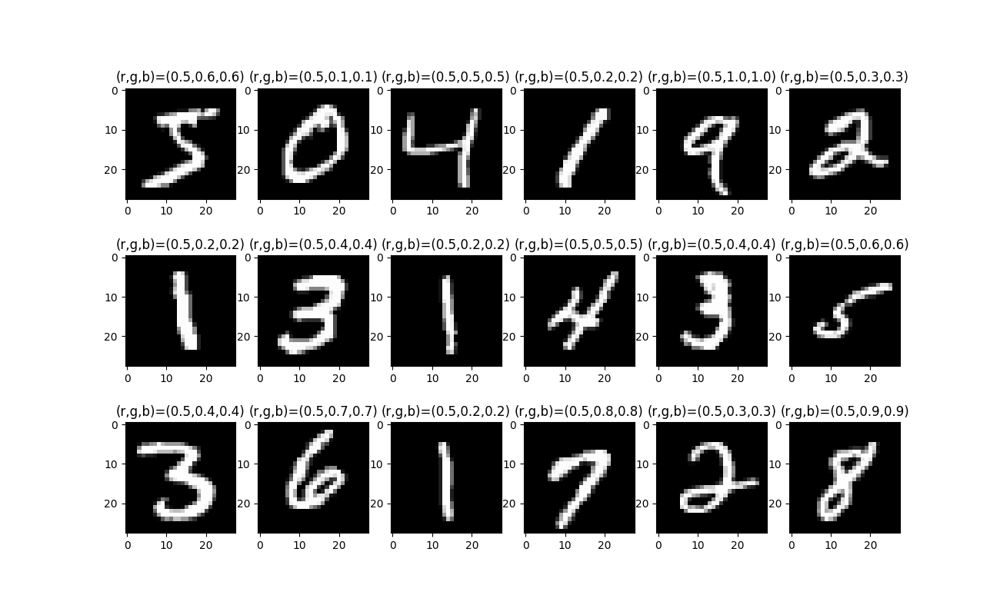

In [39]:
plot_dataset_digits(train_mnist)

In [40]:
len(train_mnist)

60000

In [54]:
# for i, (img, label) in enumerate(train_mnist):
#     print(np.array(img))
#     print(np.array(img).shape)
#     print(rescale_values(np.array(img)))
#     arr = rescale_values(np.array(img)).reshape((28,28,1))
#     sys.exit(0)

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3  18  18  18 126 136
  175  26 166 255 247 127   0   0   0   0]
 [  0   0   0   0   0   0   0   0  30  36  94 154 170 253 253 253 253 253
  225 172 253 242 195  64   0   0   0   0]
 [  0   0   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251
   93  82  82  56  39   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18 219 253 253 253 253 253 198 18

NameError: name 'sys' is not defined

In [355]:
def rescale_values(image,max_val=1.0,min_val=0.0):
    '''
    image - numpy array
    max_val/min_val - float
    '''
    return (image-image.min())/(image.max()-image.min())*(max_val-min_val)+min_val

#     sup_test[test_inds] = np.apply_along_axis(rescale_values,1,sup_test[test_inds])

# Convert MNIST PIL images to 3 channel NP arrays and return separated data and label arrays
def preprocess_data(train_mnist, test_mnist):
    data = np.zeros((len(train_mnist)+len(test_mnist),28,28,3))
    labels = np.zeros(len(train_mnist)+len(test_mnist))
    
    for i, (img, label) in enumerate(train_mnist):
        arr = rescale_values(np.array(img)).reshape((28,28,1))
        
#         noise = np.random.normal(loc=0.0,scale=255.0,size=(28,28,1))
#         arr = arr + noise_scale*noise
        
        im_arr = np.concatenate([np.array(arr),np.array(arr),np.array(arr)], axis=2)
        
#         noise = np.random.normal(loc=0.0,scale=255.0,size=(28,28,3))
#         im_arr = im_arr + noise_scale*noise
        
#         print(data[i].shape)
        data[i] = im_arr
        labels[i] = label
        
    for i, (img, label) in enumerate(test_mnist):
        arr = rescale_values(np.array(img)).reshape((28,28,1))
        
#         noise = np.random.normal(loc=0.0,scale=255.0,size=(28,28,1))
#         arr = arr + noise_scale*noise
        
        im_arr = np.concatenate([arr,arr,arr], axis=2)
        
#         noise = np.random.normal(loc=0.0,scale=255.0,size=(28,28,3))
#         im_arr = im_arr + noise_scale*noise

        data[len(train_mnist)+i] = im_arr
        labels[len(train_mnist)+i] = label
    
    return data, labels

def plot_preprocessed(dataset):
    fig = plt.figure(figsize=(13, 8))
    columns = 6
    rows = 3
    # ax enables access to manipulate each of subplots
    ax = []

    for i in range(columns * rows):
        img = dataset[i]
        # create subplot and append to ax
        ax.append(fig.add_subplot(rows, columns, i + 1))

#         green = np.round(label/10 + 0.1, decimals=1) 
#         blue = np.round(1 - green, decimals=1)

        green = 1.0
        blue = 1.0
        
        ax[-1].set_title(f'(r,g,b)=(0.5,{green},{green})')  # set title
        arr = np.array(img).reshape((28,28,3))
        
#         im_arr = np.concatenate([np.array(arr,dtype=int),np.array(arr,dtype=int),np.array(arr,dtype=int)], axis=2)
        
        plt.imshow(arr)

    plt.show()  # finally, render the plot

In [356]:
def create_colours():
    blue = 1.0
    green = 0.0
    colours = []
    for i in range(11):
        print((0.2,np.round(blue,1),np.round(green,1)))
        colours.append((0.2,np.round(blue,1),np.round(green,1)))
        blue -= 0.1
        green += 0.1
        
    return colours

In [357]:
colours = create_colours()
colours.pop(5)

(0.2, 1.0, 0.0)
(0.2, 0.9, 0.1)
(0.2, 0.8, 0.2)
(0.2, 0.7, 0.3)
(0.2, 0.6, 0.4)
(0.2, 0.5, 0.5)
(0.2, 0.4, 0.6)
(0.2, 0.3, 0.7)
(0.2, 0.2, 0.8)
(0.2, 0.1, 0.9)
(0.2, 0.0, 1.0)


(0.2, 0.5, 0.5)

In [358]:
data, labels = preprocess_data(train_mnist, test_mnist)

- take 6300 samples of each class to balance classes (min num of samples per class is class 5 with N=6313, 6000 splits nicely)
- separate into training, val, test splits
- feed into no_colour, confounder, suppressor function
    - no colour: convert 100% of each split to c6=(0.5 0.5 0.5)
    - confounder: convert 50%/23%/3% of each class to c6, c_i\{c6}, the rest 
    - suppressor: convert 50% to c6, 5% to the rest

In [359]:
# this number needs to be picked s.t. 50% is divisible by 10 and 9
n_per_class = 3600

sorted_data = np.zeros((n_per_class*10,28,28,3))
sorted_labels = np.zeros((n_per_class*10,))

ind = 0
for i in range(10):
    class_labels = np.where(labels==i)[0][:n_per_class]
    sorted_data[ind:ind+n_per_class] = data[class_labels]
    sorted_labels[ind:ind+n_per_class] = labels[class_labels]
    
    ind += n_per_class

In [360]:
# Shuffled 60/20/20 split
# split 60/40 into train and val+test, then split val and test by half
data_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.4, random_state=SEED)
train_indices, val_indices = list(data_splitter.split(X=sorted_data, y=sorted_labels))[0]

x_train = sorted_data[train_indices]
y_train = sorted_labels[train_indices]
x_val_test = sorted_data[val_indices]
y_val_test = sorted_labels[val_indices]

data_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=SEED)
val_indices, test_indices = list(data_splitter.split(X=x_val_test, y=y_val_test))[0]

x_val = x_val_test[val_indices]
y_val = y_val_test[val_indices]

x_test = x_val_test[test_indices]
y_test = y_val_test[test_indices]

In [361]:
print('train per class', len(np.where(y_train==0)[0]))
print('val per class', len(np.where(y_val==0)[0]))
print('test per class', len(np.where(y_test==0)[0]))

train per class 2160
val per class 720
test per class 720


In [362]:
# create suppressor set where 50% of samples of all classes have colour c6=(0.5,0.5,0.5), 
# and the rest are split evenly 5% for each colour [c0,...,c10]\{c6}

import scipy

lower = 0
upper = 1
mu = 0.5
sigma = 0.3
truncnorm = scipy.stats.truncnorm((lower-mu)/sigma,(upper-mu)/sigma,loc=mu,scale=sigma)

def create_suppressor(data, colours, c6=(0.2,0.2,0.2), noise_scale=0.5):
    num_samples = len(data)
    suppressor_data = np.zeros(data.shape)
    colour_labels = np.zeros((data.shape[0],3))
#     colour_labels = np.array([],dtype=object)
    
    c6_chunk = data[:int(num_samples/2)]
    c6_chunk[:,:,:,0] *= c6[0]
    c6_chunk[:,:,:,1] *= c6[1]
    c6_chunk[:,:,:,2] *= c6[2]
    

#     N = 100000

#     samples = scipy.stats.truncnorm.rvs(
#               (lower-mu)/sigma,(upper-mu)/sigma,loc=mu,scale=sigma,size=c6_chunk.shape)
    
#     c6_chunk = (1-noise_scale)*c6_chunk + abs(noise_scale*np.random.normal(loc=0.0,scale=1.0,size=c6_chunk.shape))

    c6_chunk = (1-noise_scale)*c6_chunk + abs(noise_scale*truncnorm.rvs(size=c6_chunk.shape))
#     colour_labels = np.array([c6]*int(num_samples/2))
    colour_labels[:int(num_samples/2)] = np.array([c6]*int(num_samples/2))
    
    suppressor_data[:int(num_samples/2)] =  c6_chunk
#     suppressor_data[:int(num_samples/2)] = data[:int(num_samples/2)]*0.5
    
    for i, data_chunk in enumerate(np.split(data[int(num_samples/2):],10,axis=0)):
        chunk_size = len(data_chunk)

        data_chunk[:,:,:,0] *= colours[i][0]
        data_chunk[:,:,:,1] *= colours[i][1]
        data_chunk[:,:,:,2] *= colours[i][2]
        
#         samples = scipy.stats.truncnorm.rvs((lower-mu)/sigma,(upper-mu)/sigma,loc=mu,scale=sigma,size=data_chunk.shape)
        data_chunk = (1-noise_scale)*data_chunk + abs(noise_scale*truncnorm.rvs(size=data_chunk.shape))

#         data_chunk = (1-noise_scale)*data_chunk + abs(noise_scale*np.random.normal(loc=0.0,scale=1.0,size=data_chunk.shape))
        

        
        suppressor_data[int(num_samples/2)+chunk_size*i:int(num_samples/2)+chunk_size*(i+1)] = data_chunk
        
#         colour_labels = np.concatenate((colour_labels,[colours[i]]*int(data_chunk.shape[0])))
        colour_labels[int(num_samples/2)+chunk_size*i:int(num_samples/2)+chunk_size*(i+1)] = [colours[i]]*int(data_chunk.shape[0])
    return suppressor_data, colour_labels


# create confounder set where 50% of samples of all classes have colour c6=(0.5,0.5,0.5), 
# 25% have the class' colour and the rest are split evenly for each colour [c0,...,c10]\{c6}
def create_confounder(data, class_colour, colours,confounder_portion=0.25, c6=(0.2,0.2,0.2), noise_scale=0.5):
    num_samples = len(data)
    confounder_data = np.zeros(data.shape)
    colour_labels = np.zeros((data.shape[0],3))
#     confounder_data[:int(num_samples/2)] = data[:int(num_samples/2)]*0.5


    c6_chunk = data[:int(num_samples/2)]
    c6_chunk[:,:,:,0] *= c6[0]
    c6_chunk[:,:,:,1] *= c6[1]
    c6_chunk[:,:,:,2] *= c6[2]
    
    c6_chunk = (1-noise_scale)*c6_chunk + abs(noise_scale*truncnorm.rvs(size=c6_chunk.shape))
#     colour_labels.append([c6]*int(num_samples/2))
    colour_labels[:int(num_samples/2)] = np.array([c6]*int(num_samples/2))
    confounder_data[:int(num_samples/2)] = c6_chunk
    
    n_confounded = int(num_samples/2)+int(num_samples*confounder_portion) 
    
#     print(int(num_samples/2))
#     print(three_quarters)
    
    confounder_data[int(num_samples/2):n_confounded] = data[int(num_samples/2):n_confounded]

    confounder_data[int(num_samples/2):n_confounded][:,:,:,0] *= class_colour[0]
    confounder_data[int(num_samples/2):n_confounded][:,:,:,1] *= class_colour[1]
    confounder_data[int(num_samples/2):n_confounded][:,:,:,2] *= class_colour[2]
    
    confounder_data[int(num_samples/2):n_confounded] = (1-noise_scale)*confounder_data[int(num_samples/2):n_confounded] + abs(noise_scale*truncnorm.rvs(size=confounder_data[int(num_samples/2):n_confounded].shape))
    
    colour_labels[int(num_samples/2):n_confounded] = np.array([class_colour]*(n_confounded - int(num_samples/2)))
#     print(class_colour)
    
    other_colours = [x for x in colours if x != class_colour] 
    
    for i, data_chunk in enumerate(np.split(data[n_confounded:],9,axis=0)):
        chunk_size = len(data_chunk)

        data_chunk[:,:,:,0] *= other_colours[i][0]
        data_chunk[:,:,:,1] *= other_colours[i][1]
        data_chunk[:,:,:,2] *= other_colours[i][2]
        
        data_chunk = (1-noise_scale)*data_chunk + abs(noise_scale*truncnorm.rvs(size=data_chunk.shape))
        
        confounder_data[n_confounded+chunk_size*i:n_confounded+chunk_size*(i+1)] = data_chunk
        
        colour_labels[n_confounded+chunk_size*i:n_confounded+chunk_size*(i+1)] = [other_colours[i]]*int(data_chunk.shape[0])
        
    return confounder_data, colour_labels

In [363]:
noise_scale = 0.5
confounder_portion = 0.4

conf_train = np.zeros(x_train.shape)
conf_val = np.zeros(x_val.shape)
conf_test = np.zeros(x_test.shape)

sup_train = np.zeros(x_train.shape)
sup_val = np.zeros(x_val.shape)
sup_test = np.zeros(x_test.shape)

no_col_train = np.zeros(x_train.shape)
no_col_val = np.zeros(x_val.shape)
no_col_test = np.zeros(x_test.shape)

conf_train_colours = np.zeros((x_train.shape[0], 3))
conf_val_colours = np.zeros((x_val.shape[0], 3))
conf_test_colours = np.zeros((x_test.shape[0], 3))

sup_train_colours = np.zeros((x_train.shape[0], 3))
sup_val_colours = np.zeros((x_val.shape[0], 3))
sup_test_colours = np.zeros((x_test.shape[0], 3))

train_ind = 0
val_ind = 0

for i in range(10):
    train_inds = np.where(y_train==i)[0]
    val_inds = np.where(y_val==i)[0]
    test_inds = np.where(y_test==i)[0]  

    conf_train[train_inds], conf_train_colours[train_inds] = create_confounder(x_train[train_inds].copy(), colours[i], colours, confounder_portion=confounder_portion, noise_scale=noise_scale)
    conf_val[val_inds], conf_val_colours[val_inds] = create_confounder(x_val[val_inds].copy(), colours[i], colours, confounder_portion=confounder_portion, noise_scale=noise_scale)
    conf_test[test_inds], conf_test_colours[test_inds] = create_confounder(x_test[test_inds].copy(), colours[i], colours, confounder_portion=confounder_portion, noise_scale=noise_scale)
    
#     conf_train[train_inds] = np.apply_along_axis(rescale_values,1,conf_train[train_inds])
#     conf_val[val_inds] = np.apply_along_axis(rescale_values,1,conf_val[val_inds])
#     conf_test[test_inds] = np.apply_along_axis(rescale_values,1,conf_test[test_inds])
    
    sup_train[train_inds], sup_train_colours[train_inds] = create_suppressor(x_train[train_inds].copy(), colours, noise_scale=noise_scale)
    sup_val[val_inds], sup_val_colours[val_inds] = create_suppressor(x_val[val_inds].copy(), colours, noise_scale=noise_scale)
    sup_test[test_inds], sup_test_colours[test_inds] = create_suppressor(x_test[test_inds].copy(), colours, noise_scale=noise_scale)  
    
#     sup_train[train_inds] = np.apply_along_axis(rescale_values,1,sup_train[train_inds])
#     sup_val[val_inds] = np.apply_along_axis(rescale_values,1,sup_val[val_inds])
#     sup_test[test_inds] = np.apply_along_axis(rescale_values,1,sup_test[test_inds])
    
#     if i == 0:
#         conf_train_colours[train_inds] = conf_train_labels
#         conf_val_colours[val_inds] = conf_val_labels
#         conf_test_colours[test_inds] = conf_test_labels

#         sup_train_colours[train_inds] = sup_train_labels
#         sup_val_colours = sup_val_labels
#         sup_test_colours = sup_test_labels
#     else:
#         conf_train_colours = np.concatenate((conf_train_colours, conf_train_labels))
#         conf_val_colours = np.concatenate((conf_val_colours, conf_val_labels))
#         conf_test_colours = np.concatenate((conf_test_colours, conf_test_labels))
    
#         sup_train_colours = np.concatenate((sup_train_colours, sup_train_labels))
#         sup_val_colours = np.concatenate((sup_val_colours, sup_val_labels))
#         sup_test_colours = np.concatenate((sup_test_colours, sup_test_labels))
    
    no_col_train[train_inds] = (1.0-noise_scale)*(x_train[train_inds].copy()*0.2) + abs(noise_scale*truncnorm.rvs(size=no_col_train[train_inds].shape))
    no_col_val[val_inds] = (1.0-noise_scale)*(x_val[val_inds].copy()*0.2) + abs(noise_scale*truncnorm.rvs(size=no_col_val[val_inds].shape))
    no_col_test[test_inds] = (1.0-noise_scale)*(x_test[test_inds].copy()*0.2) + abs(noise_scale*truncnorm.rvs(size=no_col_test[test_inds].shape))

#     no_col_train[train_inds] = np.apply_along_axis(rescale_values,1,(1.0-noise_scale)*(x_train[train_inds].copy()*0.5) + abs(noise_scale*np.random.normal(loc=0.0,scale=255.0,size=no_col_train[train_inds].shape)))
#     no_col_val[val_inds] = np.apply_along_axis(rescale_values,1,(1.0-noise_scale)*(x_val[val_inds].copy()*0.5) + abs(noise_scale*np.random.normal(loc=0.0,scale=255.0,size=no_col_val[val_inds].shape)))
#     no_col_test[test_inds] = np.apply_along_axis(rescale_values,1,(1.0-noise_scale)*(x_test[test_inds].copy()*0.5) + abs(noise_scale*np.random.normal(loc=0.0,scale=255.0,size=no_col_test[test_inds].shape)))
    

In [364]:
sup_val.shape

(7200, 28, 28, 3)

In [365]:
sup_val_colours.shape

(7200, 3)

In [366]:
import pickle as pkl

conf_save = [(conf_train, y_train, conf_train_colours), (conf_val, y_val, conf_val_colours), (conf_test, y_test, conf_test_colours)]
sup_save = [(sup_train, y_train, sup_train_colours), (sup_val, y_val, sup_val_colours), (sup_test, y_test, sup_test_colours)]
no_col_save = [(no_col_train, y_train), (no_col_val, y_val), (no_col_test, y_test)]


with open('mnist_conf_data.pkl', 'wb') as f:
    pkl.dump(conf_save, f)
    
with open('mnist_sup_data.pkl', 'wb') as f:
    pkl.dump(sup_save, f)
    
with open('mnist_no_col_data.pkl', 'wb') as f:
    pkl.dump(no_col_save, f)

In [149]:
sup_train.min()

2.880991623044338e-09

In [150]:
sup_train.max()

0.9999906374633916

In [172]:
sup_train[1373]

array([[[0.23892091, 0.05679559, 0.30688465],
        [0.18066236, 0.2664849 , 0.2521893 ],
        [0.0505599 , 0.25875976, 0.37847083],
        ...,
        [0.31154205, 0.27139557, 0.30808909],
        [0.33537976, 0.32035882, 0.15542071],
        [0.24149169, 0.11759412, 0.21013889]],

       [[0.32393757, 0.36743782, 0.36621638],
        [0.29288804, 0.20456768, 0.26850645],
        [0.1948941 , 0.07372238, 0.01081653],
        ...,
        [0.16558535, 0.10034576, 0.31498755],
        [0.04726991, 0.15024094, 0.32337098],
        [0.24757325, 0.23414611, 0.10725263]],

       [[0.26070016, 0.3444147 , 0.10492957],
        [0.33033456, 0.09151323, 0.18966455],
        [0.16851262, 0.36043989, 0.32381211],
        ...,
        [0.09759053, 0.3805636 , 0.02082115],
        [0.11906335, 0.07500598, 0.18095859],
        [0.08223865, 0.19055994, 0.10382491]],

       ...,

       [[0.19936552, 0.23424011, 0.1415004 ],
        [0.31094117, 0.1599564 , 0.15916711],
        [0.1270102 , 0

In [120]:
def show_class_data(x_conf, x_sup, x_no_col, y, class_ind=0, n_cols=10):
    class_inds = np.where(y==class_ind)[0]
    
    sample = random.sample(list(class_inds), n_cols)
    fig, axs = plt.subplots(3,n_cols, figsize=(10,4))
    
    dataset_labels = ['Confounder', 'Suppressor', 'No\nColour']
    
    for i, dataset in enumerate([x_conf, x_sup, x_no_col]):
        for j in range(n_cols):
            if i == 0:
                axs[i,j].set_title(f'Sample\n{sample[j]}')
            axs[i,j].imshow(dataset[sample[j]])
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])
            
        axs[i,0].set_ylabel(dataset_labels[i])
            
    plt.show()

<IPython.core.display.Javascript object>


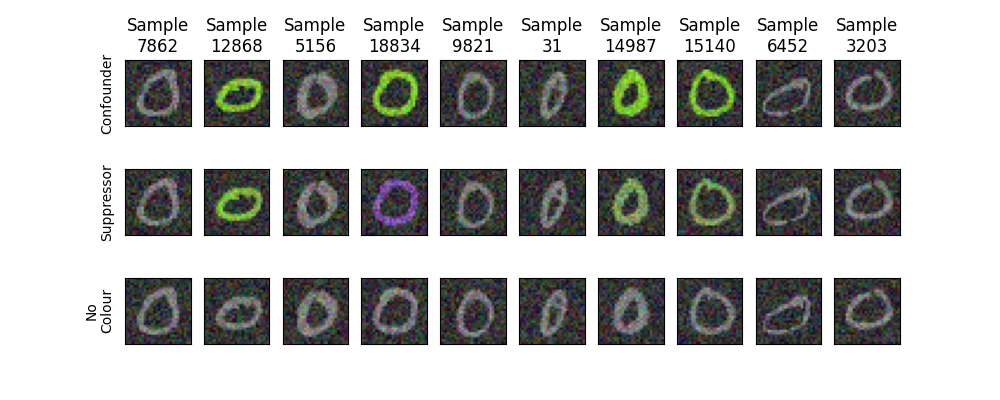

In [295]:
show_class_data(conf_train, sup_train, no_col_train, y_train, class_ind=0, n_cols=10)

In [147]:
import random

In [148]:
def show_all_classes(x_conf, x_sup, x_no_col, y, n_cols=10):
    fig, axs = plt.subplots(3*10,n_cols, figsize=(9,24), tight_layout=True)
    
    dataset_labels = ['Confounder', 'Suppressor', 'No\nColour']
    
    plot_middles = [1,4,7, 10]
    
    for i in range(10):
        class_inds = np.where(y==i)[0]
        sample = random.sample(list(class_inds), n_cols)
        
        for j in range(n_cols):
            if i == 0:
                axs[i,j].set_title(f'Sample\n{sample[j]}')
                
            if j == 0:
                axs[i*3,j].set_ylabel(f'Conf\n{i}')
                axs[i*3+1,j].set_ylabel(f'Sup\n{i}')
                axs[i*3+2,j].set_ylabel(f'No Col\n{i}')
                
            axs[i*3,j].imshow(x_conf[sample[j]])
            axs[i*3,j].set_xticks([])
            axs[i*3,j].set_yticks([])
            
            axs[i*3+1,j].imshow(x_sup[sample[j]])
            axs[i*3+1,j].set_xticks([])
            axs[i*3+1,j].set_yticks([])
            
            axs[i*3+2,j].imshow(x_no_col[sample[j]])
            axs[i*3+2,j].set_xticks([])
            axs[i*3+2,j].set_yticks([]) 
            
    plt.show()

<IPython.core.display.Javascript object>


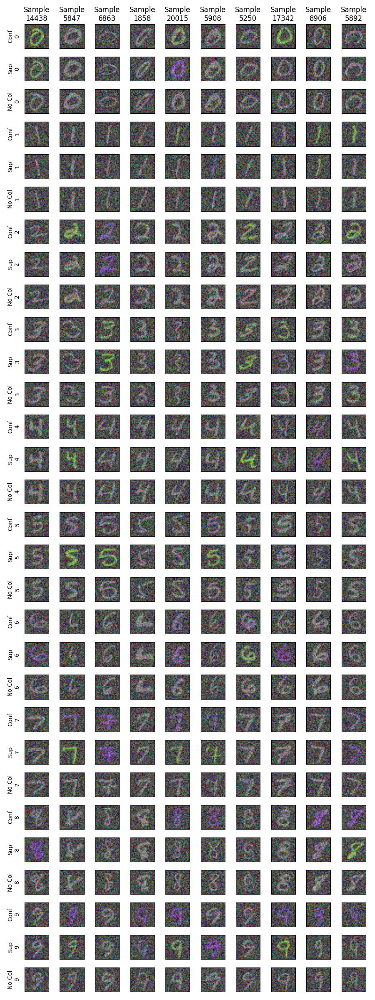

In [149]:
show_all_classes(conf_train, sup_train, no_col_train, y_train, n_cols=10)

In [348]:
confounder_test_loader = DataLoader(TensorDataset(torch.tensor(conf_test.transpose(0,3,1,2)), torch.tensor(y_test)), batch_size=64, shuffle=False)
suppressor_test_loader = DataLoader(TensorDataset(torch.tensor(sup_test.transpose(0,3,1,2)), torch.tensor(y_test)), batch_size=64, shuffle=False)

ind = 0
xs = []
labels = []
# for x_batch, test_labels in confounder_test_loader:
for x_batch, test_labels in suppressor_test_loader:
    for j in range(x_batch.shape[0]):
        x_test = x_batch[j]
        xs.append(x_test)
        labels.append(test_labels[j])
#         red_sum += torch.sum(torch.abs(x_test[0]))
#         green_sum += torch.sum(torch.abs(x_test[1]))
#         blue_sum += torch.sum(torch.abs(x_test[2]))
        
        ind += 1

<IPython.core.display.Javascript object>


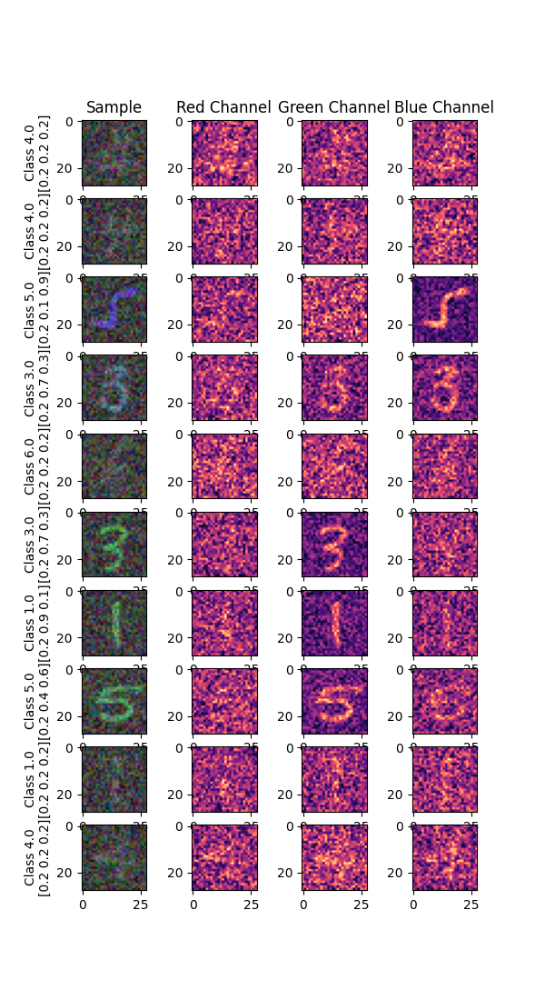

In [349]:
# plot_inds = [0, 1000, 3000, 6000, 7000]
plot_inds = random.sample(range(7200), 10)

fig, axs = plt.subplots(len(plot_inds), 4, figsize=(6,len(plot_inds)+1))

axs[0,0].set_title('Sample')
axs[0,1].set_title('Red Channel')
axs[0,2].set_title('Green Channel')
axs[0,3].set_title('Blue Channel')

for i, plot_ind in enumerate(plot_inds):
    axs[i,0].set_ylabel(f'Class {labels[plot_ind]}\n{conf_test_colours[plot_ind]}')
    axs[i,0].imshow(np.transpose(xs[plot_ind],(1,2,0)))
    axs[i,1].imshow(xs[plot_ind][0], cmap='magma')
    axs[i,2].imshow(xs[plot_ind][1], cmap='magma')
    axs[i,3].imshow(xs[plot_ind][2], cmap='magma')
    
    

## Model Training
Following the implementation of Anders et. al (2022): https://www.sciencedirect.com/science/article/pii/S1566253521001573
and https://colab.research.google.com/github/reiinakano/invariant-risk-minimization/blob/master/invariant_risk_minimization_colored_mnist.ipynb#scrollTo=9hYJRewnv80x


All models on colored MNIST in Sections 3.2 and 4.1 are trained
using the AdaDelta algorithm with a learning rate of 1.0, which is
multiplied by 0.7 after each epoch, for 10 epochs. The a posteriori ClArC
is trained for 10 epochs on top of the baseline model, which has also
been trained for 10 epochs. The network consists of 2 convolutional
layers, followed by a max-pooling, and finally 2 fully-connected layers.
Dropout is used after the max pooling and after the first fully-connected
layer, with 25 percent and 50 percent dropout probabilities respectively. ReLU activations follow all fully-connected layers except the
final one. The model used for 5.1 is trained with SGD, with a learning
rate of 0.001 for 5 epochs. The architecture, however, is the same as
for the other colored MNIST models.

In [29]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 20, 5, 1)
        self.conv2 = nn.Conv2d(20, 50, 5, 1)
        self.fc1 = nn.Linear(4 * 4 * 50, 500)
        self.fc2 = nn.Linear(500, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4 * 4 * 50)
        x = F.relu(self.fc1(x))
        logits = self.fc2(x)
        return logits

In [31]:
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy, AUROC
import time
import torch.nn.functional as F

def train(lr,epochs,train_loader,val_loader,name_model,momentum=0.9,weight_decay=1e-3,num_models=10):
    metric = AUROC(task='multiclass', num_classes=10) 
    softmax = nn.Softmax(dim=1)
    
    training_accuracy = Accuracy(task='multiclass', num_classes=10).to(DEVICE)
    val_accuracy = Accuracy(task='multiclass', num_classes=10).to(DEVICE)

    torch.manual_seed(SEED)

    trained_models = []
    training_logs = []

    for training_ind in range(num_models):
        cnn_conf=Net()
        cnn_conf.to(DEVICE)
        criterion = nn.CrossEntropyLoss()
        
        # Anders et. al uses mainly AdaDelta but also SGD in one section
#         optimizer = optim.SGD(cnn_conf.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
        optimizer = optim.Adadelta(cnn_conf.parameters(), lr=lr, weight_decay=weight_decay)


        loss_list_train=[]
        loss_list_val=[]
        acc_list_train=[]
        acc_list_val=[]
        

        min_loss = 100000000
    #     last_loss = 1000000000

        for epoch in range(epochs):  # loop over the dataset multiple times
            print(f' epoch {epoch+1} in {epochs}')
            t0=time.time()
            epoch_loss = 0.0
            epoch_loss_val= 0.0
            batch_acc=[]
            batch_acc_val=[]

            auroc_train=[]
            auroc_val=[]

            pred_train=[]
            pred_val=[]
            true_labels_train=[]
            true_labels_val=[]

            for i, data in enumerate(train_loader):
                inputs, labels = data

                inputs = inputs.to(DEVICE,dtype=torch.float)
                labels = labels.type(torch.LongTensor)
                labels=labels.to(DEVICE)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward + backward + optimize
                outputs = cnn_conf(inputs).squeeze()
                _, predicted = torch.max(outputs.data,1)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()        
                batch_acc.append(training_accuracy(predicted, labels).item())

#                 print(softmax(outputs)[:,1].detach().numpy().shape)
#                 pred_train=np.concatenate((pred_train, softmax(outputs)[:,1].detach().numpy()))
#                 true_labels_train=np.concatenate((true_labels_train, labels.cpu().numpy()))
                
                auroc_train.append(metric(outputs,labels.to(torch.int32)))

            auroc_train = sum(auroc_train)/len(auroc_train)

            for i_v, data_val in enumerate(val_loader):
                inputs_val, labels_val = data_val

                inputs_val = inputs_val.to(DEVICE,dtype=torch.float)
                labels_val = labels_val.type(torch.LongTensor)
                labels_val=labels_val.to(DEVICE)

                outputs_val = cnn_conf(inputs_val).squeeze()
                _, predicted_val = torch.max(outputs_val.data, 1)

                loss_val = criterion(outputs_val, labels_val)

                epoch_loss_val += loss_val.item()        
                batch_acc_val.append(val_accuracy(predicted_val, labels_val).item())

                auroc_val.append(metric(outputs_val,labels_val.to(torch.int32)))

#                 pred_val=np.concatenate((pred_val, softmax(outputs_val)[:,1].cpu().detach().numpy()))
#                 true_labels_val=np.concatenate((true_labels_val, labels_val.cpu().detach().numpy()))
            auroc_val = sum(auroc_val)/len(auroc_val)

            if epoch_loss_val < min_loss:
                min_loss = epoch_loss_val
                save_model = type(cnn_conf)() # get a new instance
                save_model.load_state_dict(cnn_conf.state_dict()) # copy weights and stuff

                torch.save(save_model.state_dict(), f'{str(name_model)}_{training_ind}.pt')

#             auroc_val=metric(torch.tensor(pred_val),torch.tensor(true_labels_val).to(torch.int32))

            epoch_acc=sum(batch_acc)/len(batch_acc)
            epoch_acc_val=sum(batch_acc_val)/len(batch_acc_val)

            print(f'epoch train loss: {epoch_loss} | epoch train acc {epoch_acc} | AUROC: {auroc_train}')
            print(f'epoch val loss: {epoch_loss_val} | epoch val acc {epoch_acc_val} | AUROC: {auroc_val}')
            print(f'time elapsed: {round(time.time()-t0,2)} s')

            loss_list_train.append(epoch_loss)
            loss_list_val.append(epoch_loss_val)
            acc_list_train.append(epoch_acc)
            acc_list_val.append(epoch_acc_val)

            epoch_loss = 0.0
            epoch_loss_val=0.0

        print('Finished Training')
        print()
        print('\t \t *******************')
        print()
        
        torch.save(save_model.state_dict(), f'{str(name_model)}_{training_ind}.pt')

        trained_models.append(save_model)
        training_logs.append([acc_list_train, loss_list_train, acc_list_val, loss_list_val])
#     plt.plot(loss_list_train)
#     plt.plot(loss_list_val)
#     plt.plot([i*100 for i in acc_list_train])
#     plt.plot([i*100 for i in acc_list_va])
    return trained_models, [acc_list_train, loss_list_train, acc_list_val, loss_list_val]

In [152]:
train_loader = DataLoader(TensorDataset(torch.tensor(conf_train.transpose(0,3,1,2)), torch.tensor(y_train)), batch_size=1000, shuffle=True)
val_loader = DataLoader(TensorDataset(torch.tensor(conf_val.transpose(0,3,1,2)), torch.tensor(y_val)), batch_size=1000, shuffle=True)

In [153]:
lr = 0.005
epochs = 20
num_models=1

In [154]:
train(lr,epochs,train_loader,val_loader,'mnist_conf',momentum=0.9,weight_decay=1e-3,num_models=num_models)

 epoch 1 in 20
epoch train loss: 50.67739653587341 | epoch train acc 0.09971212155439636 | AUROC: 0.47747495770454407
epoch val loss: 18.42671227455139 | epoch val acc 0.09875000081956387 | AUROC: 0.48925501108169556
time elapsed: 8.46 s
 epoch 2 in 20
epoch train loss: 50.66961479187012 | epoch train acc 0.09895454584197565 | AUROC: 0.49694985151290894
epoch val loss: 18.426389932632446 | epoch val acc 0.09687499981373549 | AUROC: 0.5045698881149292
time elapsed: 8.03 s
 epoch 3 in 20
epoch train loss: 50.66225242614746 | epoch train acc 0.09822727299549362 | AUROC: 0.5155773162841797
epoch val loss: 18.42389941215515 | epoch val acc 0.09324999991804361 | AUROC: 0.5269210934638977
time elapsed: 8.71 s
 epoch 4 in 20
epoch train loss: 50.65709948539734 | epoch train acc 0.09924242374571887 | AUROC: 0.5321400165557861
epoch val loss: 18.421675205230713 | epoch val acc 0.10137499962002039 | AUROC: 0.5387987494468689
time elapsed: 8.97 s
 epoch 5 in 20
epoch train loss: 50.651901960372925

([Net(
    (conv1): Conv2d(3, 20, kernel_size=(5, 5), stride=(1, 1))
    (conv2): Conv2d(20, 50, kernel_size=(5, 5), stride=(1, 1))
    (fc1): Linear(in_features=800, out_features=500, bias=True)
    (fc2): Linear(in_features=500, out_features=10, bias=True)
  )],
 [[0.09971212155439636,
   0.09895454584197565,
   0.09822727299549362,
   0.09924242374571887,
   0.10163636370138689,
   0.10303030366247351,
   0.10733333297751167,
   0.11542424187064171,
   0.12290909175168384,
   0.1251515153456818,
   0.12612121213566174,
   0.12919697030024094,
   0.12698484787886793,
   0.13221212205561725,
   0.14125757732174613,
   0.14649999954483725,
   0.15184848552400415,
   0.17283333363858136,
   0.17796969684687527,
   0.19133333387699994],
  [50.67739653587341,
   50.66961479187012,
   50.66225242614746,
   50.65709948539734,
   50.651901960372925,
   50.64776015281677,
   50.642269134521484,
   50.637901306152344,
   50.634474754333496,
   50.6307692527771,
   50.62670373916626,
   50.6239

In [155]:
train_loader = DataLoader(TensorDataset(torch.tensor(sup_train.transpose(0,3,1,2)), torch.tensor(y_train)), batch_size=1000, shuffle=True)
val_loader = DataLoader(TensorDataset(torch.tensor(sup_val.transpose(0,3,1,2)), torch.tensor(y_val)), batch_size=1000, shuffle=True)

train(lr,epochs,train_loader,val_loader,'mnist_sup',momentum=0.9,weight_decay=1e-3,num_models=num_models)

 epoch 1 in 20
epoch train loss: 50.67038607597351 | epoch train acc 0.09995454515923154 | AUROC: 0.49927568435668945
epoch val loss: 18.42463445663452 | epoch val acc 0.09837500099092722 | AUROC: 0.5056430101394653
time elapsed: 11.13 s
 epoch 2 in 20
epoch train loss: 50.663164138793945 | epoch train acc 0.09940909154035828 | AUROC: 0.5173222422599792
epoch val loss: 18.42413568496704 | epoch val acc 0.09649999998509884 | AUROC: 0.5225217342376709
time elapsed: 36.59 s
 epoch 3 in 20
epoch train loss: 50.65598702430725 | epoch train acc 0.09787878732789647 | AUROC: 0.5350081920623779
epoch val loss: 18.42194128036499 | epoch val acc 0.09412500122562051 | AUROC: 0.5405192375183105
time elapsed: 10.17 s
 epoch 4 in 20
epoch train loss: 50.65096879005432 | epoch train acc 0.0981212119487199 | AUROC: 0.5508639216423035
epoch val loss: 18.419853687286377 | epoch val acc 0.09975000005215406 | AUROC: 0.5521537661552429
time elapsed: 10.37 s
 epoch 5 in 20
epoch train loss: 50.64596486091614

KeyboardInterrupt: 

In [ ]:
train_loader = DataLoader(TensorDataset(torch.tensor(no_col_train.transpose(0,3,1,2)), torch.tensor(y_train)), batch_size=1000, shuffle=True)
val_loader = DataLoader(TensorDataset(torch.tensor(no_col_val.transpose(0,3,1,2)), torch.tensor(y_val)), batch_size=1000, shuffle=True)

train(lr,epochs,train_loader,val_loader,'mnist_no_col',momentum=0.9,weight_decay=1e-3,num_models=num_models)

In [350]:
from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy, AUROC

def load_trained(path, device='cpu'):
    model = Net()
    model.load_state_dict(torch.load(path,map_location=device))
    return model

def print_AUC(loader, model_ind=0, device='cpu'):

    cnn_conf=load_trained(f'./mnist_conf_{model_ind}.pt').to(device)
    cnn_sup=load_trained(f'./mnist_sup_{model_ind}.pt').to(device)
    cnn_no=load_trained(f'./mnist_no_col_{model_ind}.pt').to(device)
    
    #models -> cnn_no; cnn_sup; cnn_conf

    softmax = nn.Softmax(dim=1)
    metric = AUROC(num_classes=10, task='multiclass')

    model_conf_test_conf_pred=np.array([])
    model_sup_test_conf_pred=np.array([])
    model_no_test_conf_pred=np.array([])
    true_labels=np.array([])
    
    model_conf_auroc_test = []
    model_sup_auroc_test = []
    model_no_col_auroc_test = []

    for i_v, data_val in enumerate(loader):
        inputs_val, labels_val = data_val
        inputs_val = inputs_val.to(DEVICE,dtype=torch.float)
        labels_val = labels_val.type(torch.LongTensor)
        labels_val=labels_val.to(DEVICE)

        outputs_conf = cnn_conf(inputs_val).squeeze()
        outputs_sup = cnn_sup(inputs_val).squeeze()
        outputs_no = cnn_no(inputs_val).squeeze()

        out_pred_conf=softmax(outputs_conf)
        out_pred_sup=softmax(outputs_sup)
        out_pred_no=softmax(outputs_no)

#         model_conf_test_conf_pred=np.concatenate((model_conf_test_conf_pred, out_pred_conf[:,1].cpu().detach().numpy()))
#         model_sup_test_conf_pred=np.concatenate((model_sup_test_conf_pred, out_pred_sup[:,1].cpu().detach().numpy()))
#         model_no_test_conf_pred=np.concatenate((model_no_test_conf_pred, out_pred_no[:,1].cpu().detach().numpy()))

#         print(labels_val.shape)
#         print(model_conf_test_conf_pred)

        model_conf_auroc_test.append(metric(out_pred_conf, labels_val))
        model_sup_auroc_test.append(metric(out_pred_sup, labels_val))
        model_no_col_auroc_test.append(metric(out_pred_no, labels_val))
        
#         true_labels=np.concatenate((true_labels, labels_val.cpu().numpy()))

    print('model: confounder', sum(model_conf_auroc_test)/len(model_conf_auroc_test))
    print('model: suppressor',sum(model_sup_auroc_test)/len(model_sup_auroc_test))
    print('model: no colour',sum(model_no_col_auroc_test)/len(model_no_col_auroc_test))
    print()

    l=[sum(model_conf_auroc_test)/len(model_conf_auroc_test),
       sum(model_sup_auroc_test)/len(model_sup_auroc_test),
       sum(model_no_col_auroc_test)/len(model_no_col_auroc_test)]
    return l


In [374]:
import pickle as pkl
with open('mnist_conf_data.pkl', 'rb') as f:
    conf_data = pkl.load(f)
    
with open('mnist_sup_data.pkl', 'rb') as f:
    sup_data = pkl.load(f)
    
with open('mnist_no_col_data.pkl', 'rb') as f:
    no_col_data = pkl.load(f)

batch_size = 64

confounder_test_loader = DataLoader(TensorDataset(torch.tensor(conf_data[2][0].transpose(0,3,1,2)), torch.tensor(conf_data[2][1])),batch_size=batch_size, shuffle=False)
suppressor_test_loader = DataLoader(TensorDataset(torch.tensor(sup_data[2][0].transpose(0,3,1,2)), torch.tensor(sup_data[2][1])),batch_size=batch_size, shuffle=False)
no_col_test_loader = DataLoader(TensorDataset(torch.tensor(no_col_data[2][0].transpose(0,3,1,2)), torch.tensor(no_col_data[2][1])),batch_size=batch_size, shuffle=False)


In [375]:
batch_size=64
# confounder_test_loader = DataLoader(TensorDataset(torch.tensor(conf_test.transpose(0,3,1,2)), torch.tensor(y_test)),batch_size=batch_size, shuffle=False)
# supressor_test_loader = DataLoader(TensorDataset(torch.tensor(sup_test.transpose(0,3,1,2)), torch.tensor(y_test)),batch_size=batch_size, shuffle=False)
# no_col_test_loader = DataLoader(TensorDataset(torch.tensor(no_col_test.transpose(0,3,1,2)), torch.tensor(y_test)),batch_size=batch_size, shuffle=False)

confounder_data_results = []
suppressor_data_results = []
no_col_data_results = []

for i in range(1):
    print(f'MODEL {i}')
    print('confounder data:')
    confounder_data_results.append(print_AUC(confounder_test_loader, i))
    print()
    print('suppressor data:')
    suppressor_data_results.append(print_AUC(suppressor_test_loader, i))
    print()
    print('no colour data:')
    no_col_data_results.append(print_AUC(no_col_test_loader, i))
    print()

MODEL 0
confounder data:


C:\Users\clark01\.virtualenvs\debugging_xai-9luXJGIR\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: No positive samples in targets, true positive value should be meaningless. Returning zero tensor in true positive score
  warnings.warn(*args, **kwargs)


model: confounder tensor(0.9829)
model: suppressor tensor(0.9863)
model: no colour tensor(0.9809)


suppressor data:
model: confounder tensor(0.9803)
model: suppressor tensor(0.9866)
model: no colour tensor(0.9814)


no colour data:
model: confounder tensor(0.9758)
model: suppressor tensor(0.9814)
model: no colour tensor(0.9769)




## XAI and Evaluation

In [224]:
from captum.attr import IntegratedGradients, Saliency, DeepLift, DeepLiftShap, GradientShap  
from captum.attr import GuidedBackprop, Deconvolution, LRP, InputXGradient, Lime

# from zennit.composites import EpsilonPlusFlat
from zennit.composites import EpsilonAlpha2Beta1

device = 'cpu'

In [221]:
with open('mnist_conf_data.pkl', 'rb') as f:
    conf_data = pkl.load(f)
    
with open('mnist_sup_data.pkl', 'rb') as f:
    sup_data = pkl.load(f)
    
with open('mnist_no_col_data.pkl', 'rb') as f:
    no_col_data = pkl.load(f)
    
    
confounder_test_loader = DataLoader(TensorDataset(torch.tensor(conf_data[2][0].transpose(0,3,1,2)), torch.tensor(conf_data[2][1])),batch_size=batch_size, shuffle=False)
supressor_test_loader = DataLoader(TensorDataset(torch.tensor(sup_data[2][0].transpose(0,3,1,2)), torch.tensor(sup_data[2][1])),batch_size=batch_size, shuffle=False)
no_col_test_loader = DataLoader(TensorDataset(torch.tensor(no_col_data[2][0].transpose(0,3,1,2)), torch.tensor(no_col_data[2][1])),batch_size=batch_size, shuffle=False)


In [225]:
models = ['conf', 'sup', 'no_col']
atts = []
xs = []
x_ind = 3
for i, test_loader in enumerate([confounder_test_loader, supressor_test_loader, no_col_test_loader]):
    model = load_trained(f'./mnist_{models[i]}_0.pt').to(device)
    data_ind = 0
    atts_loader = []
    xs_loader = []
    for x_batch, test_label in test_loader:      
#         outputs = model(x_test.to(torch.float))
        
        for j in range(x_batch.shape[0]):
            x_test = x_batch[j]
            xs_loader.append(x_test)
            atts_loader.append(LRP(model).attribute(x_test.reshape(1,3,28,28).to(torch.float32), target=int(test_label[j])))
    xs.append(xs_loader)
    atts.append(atts_loader)

C:\Users\clark01\.virtualenvs\debugging_xai-9luXJGIR\lib\site-packages\captum\_utils\gradient.py:59: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  "required_grads has been set automatically." % index


KeyboardInterrupt: 

In [ ]:
len(xs[0])

In [118]:
print(red_sum, green_sum, blue_sum)

tensor(1353126.6617, dtype=torch.float64) tensor(1353873.3182, dtype=torch.float64) tensor(1352244.5037, dtype=torch.float64)


In [ ]:
fig,axs = plt.subplots(3,6)
plot_ind = int(7200/2)
cmaps = ['Reds', 'Greens', 'Blues']

xs = []
for j in range(3):
    axs[j,0].imshow(np.transpose(xs[j][plot_ind].detach().numpy(),(1,2,0)))
    axs[j,1].imshow(np.transpose(atts[j][plot_ind].detach().numpy().reshape(3,28,28),(1,2,0)))
    
    rgb_sum = np.sum(np.abs(atts[j][plot_ind].detach().numpy().reshape(3,28,28)))
#     print(rgb_sum)
    
#     axs[j,1].set_title(f'{np.round(rgb_sum,2)}')
    
    channels = []
    for i in range(3):
        att = atts[j][plot_ind].detach().numpy().reshape(3,28,28)
        channel = att[i]
        channels.append(abs(channel))
    #     print(channel.shape)
    #     channel = np.transpose(lrp_att.detach().numpy().reshape(3,28,28)[i],(1,2,0)).astype(int)
    #     print(channel.shape)
        channel_sum = np.sum(np.abs(channel))/rgb_sum
        axs[j,2+i].set_title(f'{np.round(channel_sum,1)}')
        axs[j,2+i].imshow(abs(channel), cmap=cmaps[i])
#         rgb_sum += channel_sum
    
    axs[j,1].set_title(f'{np.round(rgb_sum,2)}')
    
    axs[j,5].imshow(np.sum(channels, axis=0), cmap='magma')
    

## Histograms

In [2]:


file = open(f'energies_mnist_0.pickle', 'rb')
energies = pickle.load(file)

In [3]:
energies

{'conf': {'conf': [{'deconv': [0.3380404,
     0.33933148,
     0.34378198,
     0.34000173,
     0.3416649,
     0.34456715,
     0.33985436,
     0.33972952,
     0.34446913,
     0.34338102,
     0.33560425,
     0.3414337,
     0.33805242,
     0.34216046,
     0.3425952,
     0.3430296,
     0.34088045,
     0.33891657,
     0.34081665,
     0.3399682,
     0.3401535,
     0.3341671,
     0.34344777,
     0.34348735,
     0.33940646,
     0.338828,
     0.34321925,
     0.34348345,
     0.3401503,
     0.34013832,
     0.3425464,
     0.34342188,
     0.34368977,
     0.34422857,
     0.33889985,
     0.33897728,
     0.3369681,
     0.3427507,
     0.343881,
     0.3398719,
     0.33702126,
     0.3425027,
     0.3392697,
     0.3377596,
     0.33424327,
     0.34301913,
     0.34468955,
     0.34173396,
     0.34050396,
     0.34380993,
     0.33930075,
     0.33571514,
     0.34285548,
     0.3416025,
     0.3342346,
     0.3443813,
     0.3382353,
     0.3428526,
     0.344170

In [369]:
method = 'lrp_ab'

conf_conf = [[],[],[]]
conf_sup = [[],[],[]]
conf_no = [[],[],[]]

sup_conf = [[],[],[]]
sup_sup = [[],[],[]]
sup_no = [[],[],[]]

no_conf = [[],[],[]]
no_sup = [[],[],[]]
no_no = [[],[],[]]

for model_ind in range(1):
    file = open(f'energies_mnist_{model_ind}.pickle', 'rb')
    energies = pickle.load(file)
    
    for i in range(3):
        conf_conf[i].extend(energies['conf']['conf'][i][method])
        conf_sup[i].extend(energies['conf']['sup'][i][method])
        conf_no[i].extend(energies['conf']['no_col'][i][method])
        
        sup_conf[i].extend(energies['sup']['conf'][i][method])
        sup_sup[i].extend(energies['sup']['sup'][i][method])
        sup_no[i].extend(energies['sup']['no_col'][i][method])

        no_conf[i].extend(energies['no_col']['conf'][i][method])
        no_sup[i].extend(energies['no_col']['sup'][i][method])
        no_no[i].extend(energies['no_col']['no_col'][i][method])
        
        
combined_energies = {
    'conf': { # conf model on conf/sup/no data
        'conf': conf_conf,
        'sup': conf_sup, 
        'no_col': conf_no},
            
    'sup': { # sup model on conf/sup/no data
        'conf': sup_conf,
        'sup': sup_sup, 
        'no_col': sup_no},

    'no_col': { # no_col model on conf/sup/no data
        'conf': no_conf,
        'sup': no_sup, 
        'no_col': no_no},
}

In [212]:
energies['conf']['conf'][i].keys()

dict_keys(['deconv', 'int_grads', 'shap', 'lrp', 'lrp_ab'])

In [334]:
np.max([combined_energies[model_name][dataset][1], combined_energies[model_name][dataset][2]],axis=0)

array([0.33290023, 0.33710837, 0.3411148 , ..., 0.3506894 , 0.33551672,
       0.34012935], dtype=float32)

### Note: maybe replace 3 r,g,b histograms with red vs pairwise avg(blue,green)

<IPython.core.display.Javascript object>


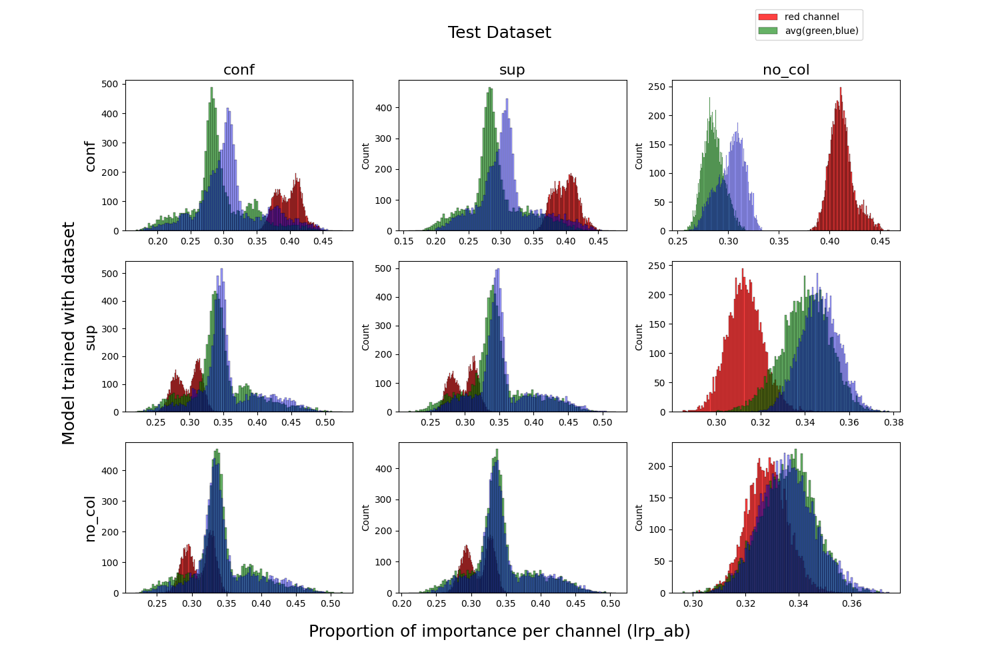

Text(0.5, 0.05, 'Proportion of importance per channel (lrp_ab)')

In [373]:
font_size = 16

fig,axs=plt.subplots(3,3, figsize=(15, 10))
# sns.histplot(ax=axs[1,1],data=[energies['conf']['conf'][0]['lrp_ab'], energies['conf']['conf'][1]['lrp_ab'], energies['conf']['conf'][2]['lrp_ab']],bins=100)

for i, model_name in enumerate(['conf', 'sup', 'no_col']):
    
    for j, dataset in enumerate(['conf', 'sup', 'no_col']):
        if i == 0:
            axs[0,j].set_title(dataset, fontsize=font_size)
#         sns.histplot(ax=axs[i,j],data=[combined_energies[model_name][dataset][0], combined_energies[model_name][dataset][1], combined_energies[model_name][dataset][2]],bins=1000, color=['red','green','blue'])
        
        sns.histplot(ax=axs[i,j],data=combined_energies[model_name][dataset][0],bins=100, color='red', edgecolor='black')
        sns.histplot(ax=axs[i,j],data=combined_energies[model_name][dataset][1],bins=100, color='green', edgecolor='black', alpha=0.6)
        sns.histplot(ax=axs[i,j],data=combined_energies[model_name][dataset][2],bins=100, color='blue', edgecolor='black', alpha=0.4)
    
#         sns.histplot(ax=axs[i,j],data=[np.mean([combined_energies[model_name][dataset][1], combined_energies[model_name][dataset][2]],axis=0), combined_energies[model_name][dataset][0]],bins=100, color=['red','green','blue'])
        
        axs[i, j].legend([],[], frameon=False)
#         axs[i,j].set_ylabel('')
        
#         if i!=2:
#             axs[i,j].set_xticks([])
            
#         if j!=0:
#             axs[i,j].set_yticks([])
        
        #         axs[i,j].set_title(f'model: {model_name}, dataset: {dataset}')
    axs[i,0].set_ylabel(model_name, fontsize=16)

axs[0,0].legend(['red channel', 'avg(green,blue)'],loc='upper center', bbox_to_anchor=(3.0, 1.5), ncol=1)

# axs[0,0].legend(['red channel', 'green channel', 'blue channel'],loc='upper center', bbox_to_anchor=(3.0, 1.5), ncol=1)
plt.figtext(0.07,0.5,"Model trained with dataset", va="center", ha="center", size=font_size+2,rotation='vertical')
plt.figtext(0.5,0.95,"Test Dataset", va="center", ha="center", size=font_size+2,)
plt.figtext(0.5,0.05,f"Proportion of importance per channel ({method})", va="center", ha="center", size=font_size+2,)


In [371]:
combined_energies[model_name][dataset][1]

for i, model_name in enumerate(['conf', 'sup', 'no_col']):
    print(f'====== MODEL: {model_name} ======')
    for j, dataset in enumerate(['conf', 'sup', 'no_col']):
        print(f'====== DATASET: {dataset} ======')
        print(f'avg red: {np.mean(np.array(combined_energies[model_name][dataset][0]))}')
        print(f'avg green: {np.mean(np.array(combined_energies[model_name][dataset][1]))}')
        print(f'avg blue: {np.mean(np.array(combined_energies[model_name][dataset][2]))}')

    print('\n')


# for n_method in range(7):
# #     print(list(energy_no_water_conf.keys())[n_method])
# #     print(methods[n_method])
#     print('====== dataset:watermark ======')
    
#     print('model: confounder ', round(np.mean(np.array(train_energy[n_method][0][1])),3))
#     print('model: supressor', round(np.mean(np.array(train_energy[n_method][1][1])),3))
#     print('model: no watermark  ', round(np.mean(np.array(train_energy[n_method][2][1])),3))
    
#     print('====== dataset:no watermark ======')
    
#     print('model: confounder', round(np.mean(np.array(train_energy[n_method][0][0])),3))
#     print('model: supressor ', round(np.mean(np.array(train_energy[n_method][1][0])),3))
#     print('model: no watermark ', round(np.mean(np.array(train_energy[n_method][2][0])),3))
#     print()

====== MODEL: conf ======
====== DATASET: conf ======
avg red: 0.39843153953552246
avg green: 0.29106464982032776
avg blue: 0.31050384044647217
====== DATASET: sup ======
avg red: 0.39950379729270935
avg green: 0.2910465896129608
avg blue: 0.3094496726989746
====== DATASET: no_col ======
avg red: 0.41198140382766724
avg green: 0.2854858636856079
avg blue: 0.3025326728820801


====== MODEL: sup ======
====== DATASET: conf ======
avg red: 0.2976093292236328
avg green: 0.3462405204772949
avg blue: 0.35615015029907227
====== DATASET: sup ======
avg red: 0.29768067598342896
avg green: 0.34623944759368896
avg blue: 0.3560798764228821
====== DATASET: no_col ======
avg red: 0.313096284866333
avg green: 0.34028273820877075
avg blue: 0.346621036529541


====== MODEL: no_col ======
====== DATASET: conf ======
avg red: 0.3106573522090912
avg green: 0.34293827414512634
avg blue: 0.3464043438434601
====== DATASET: sup ======
avg red: 0.31070196628570557
avg green: 0.3429648280143738
avg blue: 0.3463

In [ ]:
method = 'lrp_ab'

conf_conf = [[],[],[]]
conf_sup = [[],[],[]]
conf_no = [[],[],[]]

sup_conf = [[],[],[]]
sup_sup = [[],[],[]]
sup_no = [[],[],[]]

no_conf = [[],[],[]]
no_sup = [[],[],[]]
no_no = [[],[],[]]

for model_ind in range(5):
    file = open(f'energies_mnist_{model_ind}.pickle', 'rb')
    energies = pickle.load(file)
    
    for i in range(3):
        conf_conf[i].extend(energies['conf']['conf'][i][method])
        conf_sup[i].extend(energies['conf']['sup'][i][method])
        conf_no[i].extend(energies['conf']['no_col'][i][method])
        
        sup_conf[i].extend(energies['sup']['conf'][i][method])
        sup_sup[i].extend(energies['sup']['sup'][i][method])
        sup_no[i].extend(energies['sup']['no_col'][i][method])

        no_conf[i].extend(energies['no_col']['conf'][i][method])
        no_sup[i].extend(energies['no_col']['sup'][i][method])
        no_no[i].extend(energies['no_col']['no_col'][i][method])
        
        
combined_energies = {
    'conf': { # conf model on conf/sup/no data
        'conf': conf_conf,
        'sup': conf_sup, 
        'no_col': conf_no},
            
    'sup': { # sup model on conf/sup/no data
        'conf': sup_conf,
        'sup': sup_sup, 
        'no_col': sup_no},

    'no_col': { # no_col model on conf/sup/no data
        'conf': no_conf,
        'sup': no_sup, 
        'no_col': no_no},
}

In [16]:
np.mean([combined_energies['conf']['conf'][1], combined_energies['conf']['conf'][2]], axis=0)

array([0.2937253 , 0.30320936, 0.29288983, ..., 0.28298333, 0.26691133,
       0.26033294], dtype=float32)